# 🐶 End-to-end Multiclass Dog Breed Classification

This notebook buils end-to-end multi-class image classiifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we are using is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed each test image.

## 4. Features

Some information about data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There around 10,000+ images in training set (these images have labels).
* These are around 10,000+ images in test set
(these images have no labels, because we'll want to predict them).

### Get our Workspace ready!

* Import Tesnrflow 2.x ✅
* Import Tensorflow Hub.
* Make sure we're using a GPU.

In [ ]:
# Import Tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available")

2.8.0
0.12.0
GPU available (YESSSS!!!)


In [ ]:
!unzip "drive/MyDrive/DogVision/dog-breed-identification.zip" -d "drive/MyDrive/DogVision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/DogVision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/DogVision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/DogVision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/DogVision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/DogVision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/DogVision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/DogVision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/DogVision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/DogVision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/DogVision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/DogVision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/DogVision/train/8406

In [ ]:
import os 

In [ ]:
os.listdir("drive/MyDrive/DogVision/train/")[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checlout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.shape

(10222, 2)

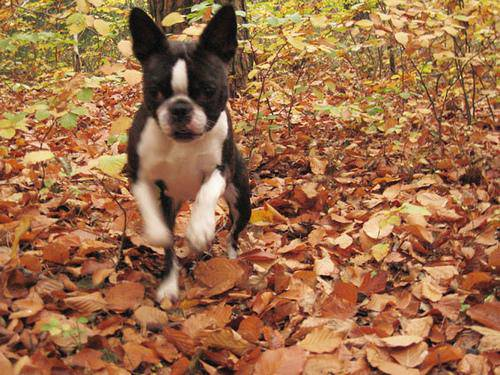

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all our images file pathnames

In [ ]:
filenames = ["drive/MyDrive/DogVision/train/" + fname + ".jpg"for fname in list(labels_csv["id"])]
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of file names matches number of actual image files
if len(os.listdir("drive/MyDrive/DogVision/train/")) == len(filenames):
  print("Filenames match actual content of files!! Proceed.")
else:
  print("Check the number of files once..")

Filenames match actual content of files!! Proceed.


In [ ]:
os.listdir("drive/MyDrive/DogVision/train/")[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(os.listdir("drive/MyDrive/DogVision/train/")), len(filenames)

(10222, 10222)

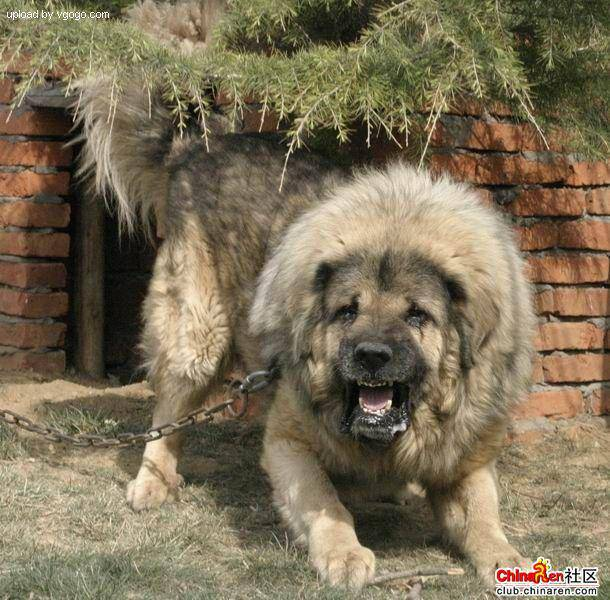

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepre our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # or labels = numpy(labels_csv)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("ALL OK")
else:
  print("No. of labels does not match number of filenames, check data directories")

ALL OK


In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean entry
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#Example
arr = np.array([1,3,5,23,2,5,0])
arr.argmax()

3

In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set

SInce the dataset from kaggle doesnt't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y
X = filenames
y = boolean_labels
X[:10], y[:10]

(['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
  'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
  'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
  'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
  'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
  'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

In [ ]:
len(filenames)

10222

We're going to start of experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max: 10000, step: 1000}


In [ ]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split

#np.random.seed(42)

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at training data
X_train[:5]

['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
y_train[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use tensorflow to read the file save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Turn our `image` to be shaped of (224, 224)
5. Return the modified `image`.

Before we do, let's see what importing an image look like...

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape, image.max(), image.min()

((257, 350, 3), 255, 0)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image look likes as a tensor, let's make a function to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224 # ht. & width

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


### Turning Data Into Batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So tht's why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size if needed).

In order to use TensorFLow effectively, we need our data in the form of Tuples which look like this: 
 `(image, label)` 

In [ ]:
# Create a simple function to return tuple (image, label)

def get_image_label(image_path, label):

  """
  Takes an image file path name and the associated label,
  processes the image and returns a type of (image, label).
  """
  image = process_image(image_path)
  return image, label 


In [ ]:
# Demo of above 
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 ia a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, 
                       y=None, batch_size = BATCH_SIZE, valid_data = False, 
                       test_data = False):
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only file path (no label)

    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch
  
 
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    
    return data_batch



In [ ]:
# Creating training and validations data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y_train[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Visualizing data batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize the batches

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displaya plot of 25 images and their labels from data batch.
  """

  plt.figure(figsize = (10, 10))

  for i in range(25):
    
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels), train_images

(32, 32, array([[[[4.62745130e-01, 4.62745130e-01, 4.62745130e-01],
          [4.53781545e-01, 4.53781545e-01, 4.53781545e-01],
          [4.44817960e-01, 4.44817960e-01, 4.44817960e-01],
          ...,
          [1.26610622e-01, 1.30532190e-01, 1.38375327e-01],
          [1.23809524e-01, 1.27731085e-01, 1.35574222e-01],
          [1.21568635e-01, 1.25490203e-01, 1.33333340e-01]],
 
         [[4.66491640e-01, 4.66491640e-01, 4.66491640e-01],
          [4.57528055e-01, 4.57528055e-01, 4.57528055e-01],
          [4.48029250e-01, 4.48029250e-01, 4.48029250e-01],
          ...,
          [1.28483877e-01, 1.32405445e-01, 1.40248582e-01],
          [1.26485601e-01, 1.30407169e-01, 1.38250306e-01],
          [1.25315130e-01, 1.29236698e-01, 1.37079835e-01]],
 
         [[4.71603662e-01, 4.71603662e-01, 4.71603662e-01],
          [4.62640077e-01, 4.62640077e-01, 4.62640077e-01],
          [4.52701122e-01, 4.52701122e-01, 4.52701122e-01],
          ...,
          [1.31039888e-01, 1.34961456e-01

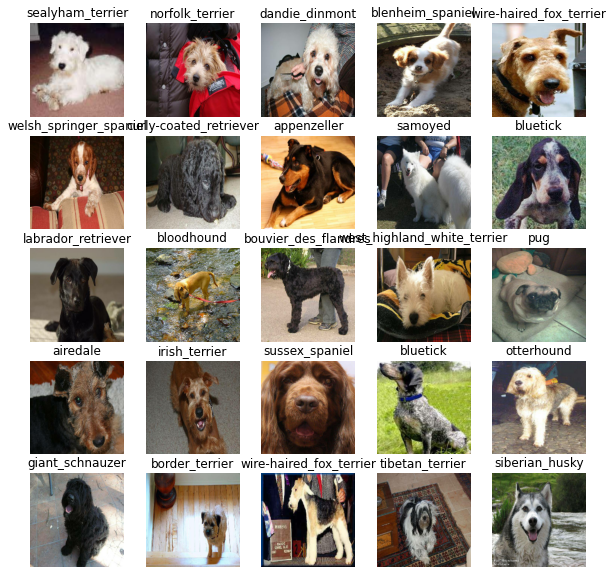

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

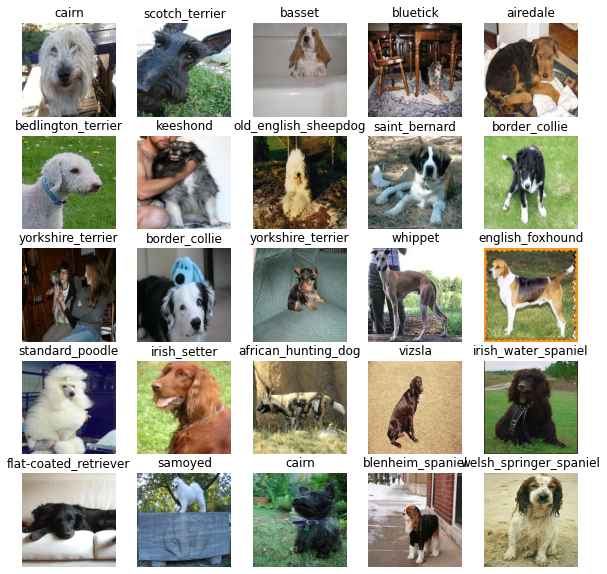

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
unique_breeds[19]

'boston_bull'

In [ ]:
labels[0]

'boston_bull'

In [ ]:
y[0].argmax()

19

## Building a model

Before we build a model, there are a few things we need to define.

* The input shape (our images shpe, in the form of Tensors) to our model.

* The output shape (image labels, in the form of Tensors) of our model.

* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channel

# SEtup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go. Let's put them together int Keras deep learning model

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen
* Defines the layers in Keras model in sequential fashion (do this, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model.(tells the model the input shape it'll be getting).
* Returns the mdoel.

In [ ]:
# Create a function which builds Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE,
                 model_url = MODEL_URL):
  
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), #Layer1 (input layer)
     tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                           activation = "softmax") # Layer2 output layer
                           ])

  #Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape = (1,1,120))
outputs

array([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress or stop training early if a model stops improving.

We'll create two callbacks - 
* TensorBoard
* Early Stopping Callback

## TensorBoard CallBack

To setup a tensorboard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to directory and pass it to our model"s `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/DogVision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps our model from overfitting by stopping training if. certain evaluation metric stops improving.

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)


# Training a model (on a subset of data)

 Our first model is only going to train 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10, max:100}

In [ ]:
# Check to make sure we're still running on GPU
print("GPU", "available (YESS!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YESS!!)


Let's create a function which trains a model.
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()`.
* Call the `fit()` function on our model passing it training data, validating data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use.
* Return the model. 

In [ ]:
# Build a function to train and return a trained model.
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard callback
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model
model = train_model()

Epoch 1/100
25/25 [==============================] - 21s 261ms/step - loss: 4.6160 - accuracy: 0.0913 - val_loss: 3.4885 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 5s 186ms/step - loss: 1.6401 - accuracy: 0.6950 - val_loss: 2.2017 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 5s 182ms/step - loss: 0.5751 - accuracy: 0.9300 - val_loss: 1.7062 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 5s 189ms/step - loss: 0.2660 - accuracy: 0.9812 - val_loss: 1.4997 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 5s 200ms/step - loss: 0.1528 - accuracy: 0.9950 - val_loss: 1.4420 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 5s 196ms/step - loss: 0.1041 - accuracy: 0.9975 - val_loss: 1.3923 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 5s 198ms/step - loss: 0.0780 - accuracy: 1.0000 - val_loss: 1.3616 - val_accuracy: 0.640

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep earning neural networks?

**NOTE** : Overfitting to begin with is a good thing! It means our model is learning!!

In [ ]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 209ms/step


array([[3.0137633e-04, 7.8010351e-05, 1.6609356e-03, ..., 5.9165013e-05,
        1.5893280e-05, 5.8260304e-03],
       [3.1512496e-03, 3.8798235e-04, 6.0241699e-04, ..., 9.5850330e-05,
        8.3452673e-04, 5.9301456e-05],
       [4.7567914e-06, 1.1576881e-05, 8.2139532e-06, ..., 5.1203282e-05,
        3.2556175e-06, 2.3350463e-05],
       ...,
       [1.2456915e-06, 2.5125879e-05, 1.2594062e-05, ..., 9.0752728e-06,
        3.2940687e-05, 8.6940681e-06],
       [4.0134965e-03, 1.5736176e-04, 2.1047573e-04, ..., 6.2764724e-05,
        7.4427706e-05, 6.1514163e-03],
       [1.2728655e-03, 1.9222718e-05, 9.0190582e-03, ..., 3.5156410e-03,
        1.1463789e-04, 3.3566892e-05]], dtype=float32)

In [ ]:
predictions[0]

array([3.01376334e-04, 7.80103510e-05, 1.66093558e-03, 8.95721314e-05,
       5.35865947e-05, 3.22026972e-05, 1.92317888e-02, 7.62047013e-04,
       3.95956245e-04, 1.37995870e-03, 8.40262277e-04, 1.52196608e-05,
       6.48592031e-05, 1.57975577e-04, 7.46213045e-05, 3.00578249e-04,
       2.23223105e-05, 3.54812592e-01, 2.98109007e-05, 2.96259008e-04,
       2.71148951e-04, 7.09433953e-05, 5.91875551e-06, 6.60537858e-04,
       3.39422841e-05, 4.53035376e-04, 2.72127688e-01, 5.42794551e-05,
       4.70333878e-04, 1.28611442e-04, 1.77232014e-05, 1.23205275e-04,
       1.80089468e-04, 3.97874028e-05, 3.65281776e-05, 1.07575608e-02,
       2.92011305e-06, 1.97666832e-05, 6.01794000e-06, 3.26856971e-04,
       8.71331358e-05, 2.27423316e-05, 6.15070967e-05, 5.22696879e-04,
       5.23816880e-06, 6.34127136e-05, 1.57456743e-05, 8.69824435e-05,
       2.91281234e-04, 3.02509998e-05, 1.70401006e-04, 1.96248511e-05,
       9.36681114e-04, 3.28259412e-05, 5.42980961e-05, 1.08440236e-05,
      

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
np.sum(predictions[0]), np.sum(predictions[1])

(1.0, 1.0)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.79602851e-05 6.14975870e-05 5.70251104e-05 1.09995854e-04
 3.41867376e-03 9.63571219e-05 3.13198310e-04 6.07808935e-04
 5.66749601e-03 2.70556640e-02 9.00339073e-05 8.94027562e-06
 8.49095755e-04 3.38741275e-03 1.36443309e-03 4.16680565e-03
 5.89083247e-05 3.13489058e-04 1.44905149e-04 2.08583602e-04
 5.23813615e-05 8.57947671e-05 1.58733565e-05 7.21991892e-05
 4.19472978e-02 1.36691684e-04 3.91421745e-05 6.29882386e-04
 5.39902947e-04 2.80853856e-05 2.18108871e-05 1.37699521e-04
 7.18728043e-05 6.83447652e-05 5.61849374e-05 2.39551227e-05
 3.42226522e-05 1.96267094e-04 8.61709050e-05 3.53001148e-01
 7.90751306e-04 3.07785267e-05 5.58826141e-03 6.90990646e-06
 2.05322809e-04 7.90747072e-05 4.44212666e-04 5.17768494e-04
 2.11666666e-05 6.96275383e-04 1.44147896e-04 7.20836106e-05
 1.24015589e-03 5.55265788e-03 1.66667996e-05 1.63292847e-04
 6.91953755e-05 1.99988062e-05 6.95721465e-05 9.03615091e-06
 1.97090063e-04 7.53006840e-04 8.54817699e-06 1.26831101e-05
 3.94747593e-04 2.095122

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the images the prediction is being made on!

**NOTE** : Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective labels 
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probbilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, labels) and returns seperate arrays
  of images and labels.
  """
  images_ = []
  labels_ = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    # labels_.append(label)
    labels_.append(unique_breeds[np.argmax(label)])
  
  return images_ , labels_

# Check the working
val_images, val_labels = unbatchify(val_data)
val_images[2], val_labels[2]

(array([[[0.5058824 , 0.5019608 , 0.48627454],
         [0.50920874, 0.5052872 , 0.48960087],
         [0.5101191 , 0.5061975 , 0.49051124],
         ...,
         [0.5539391 , 0.54609597, 0.55001754],
         [0.54569334, 0.5378502 , 0.54177177],
         [0.5544469 , 0.54660374, 0.5505253 ]],
 
        [[0.5058824 , 0.5019608 , 0.48627454],
         [0.50920874, 0.5052872 , 0.48960087],
         [0.5101191 , 0.5061975 , 0.49051124],
         ...,
         [0.56080186, 0.5529587 , 0.5568803 ],
         [0.54571086, 0.5378677 , 0.5417893 ],
         [0.5544644 , 0.54662126, 0.55054283]],
 
        [[0.5058824 , 0.5019608 , 0.48627454],
         [0.50920874, 0.5052872 , 0.48960087],
         [0.5101191 , 0.5061975 , 0.49051124],
         ...,
         [0.5673495 , 0.55950636, 0.5634279 ],
         [0.5496149 , 0.54177177, 0.54569334],
         [0.55836844, 0.5505253 , 0.5544469 ]],
 
        ...,
 
        [[0.6912111 , 0.67552483, 0.6637601 ],
         [0.6891121 , 0.67342585, 0.66166

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get:
* Prediction labels
* Vlidation labes
* Validation images

Let's make some function to make these all bit more visualize

We'll create a function which:
* Takes an array of prediction probs, an array of truth labels and an array of images and an integer.
* Convert the prediction probs to prediction labels
* Plot the predicted label, its predicted probs, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the predictions, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of title depending on if prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), color = color)

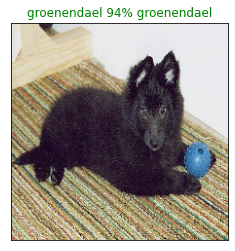

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

In [ ]:
val_labels[77]

'groenendael'

Now we've got one function to visualize our models top prediction, let's make another to view our model's top 10 predictions.

The function will:
* Take an input of prediction probabilities array and a ground truth label and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 prediction probability values and labels, coloring true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):

  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


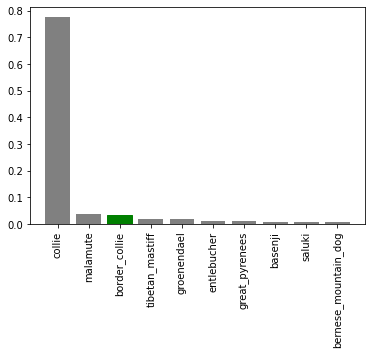

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

In [ ]:
np.max(predictions[0].argsort())

119

In [ ]:
predictions[0][predictions[0].argsort()]

array([2.92011305e-06, 5.23816880e-06, 5.91875551e-06, 6.01794000e-06,
       7.97606481e-06, 9.69448683e-06, 1.08440236e-05, 1.30704748e-05,
       1.49130356e-05, 1.52196608e-05, 1.57456743e-05, 1.58932799e-05,
       1.77232014e-05, 1.96248511e-05, 1.97666832e-05, 2.23223105e-05,
       2.27423316e-05, 2.98109007e-05, 3.02509998e-05, 3.22026972e-05,
       3.28259412e-05, 3.39422841e-05, 3.65281776e-05, 3.94834969e-05,
       3.97874028e-05, 5.35865947e-05, 5.39075627e-05, 5.42794551e-05,
       5.42980961e-05, 5.45461371e-05, 5.91650132e-05, 6.03448243e-05,
       6.15070967e-05, 6.34127136e-05, 6.48592031e-05, 7.09433953e-05,
       7.46213045e-05, 7.80103510e-05, 8.19134366e-05, 8.62939341e-05,
       8.69824435e-05, 8.71331358e-05, 8.78280844e-05, 8.95721314e-05,
       9.22063773e-05, 9.22602121e-05, 9.34744166e-05, 9.92495843e-05,
       9.97203533e-05, 1.01368605e-04, 1.04751794e-04, 1.15166447e-04,
       1.19752098e-04, 1.23205275e-04, 1.28611442e-04, 1.34530070e-04,
      

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 17,  26, 103, 109,  59,  65,  70,   6, 102,  73])

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'cairn', 'soft-coated_wheaten_terrier',
       'tibetan_terrier', 'irish_wolfhound', 'komondor', 'lhasa',
       'australian_terrier', 'silky_terrier', 'maltese_dog'], dtype=object)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out few.

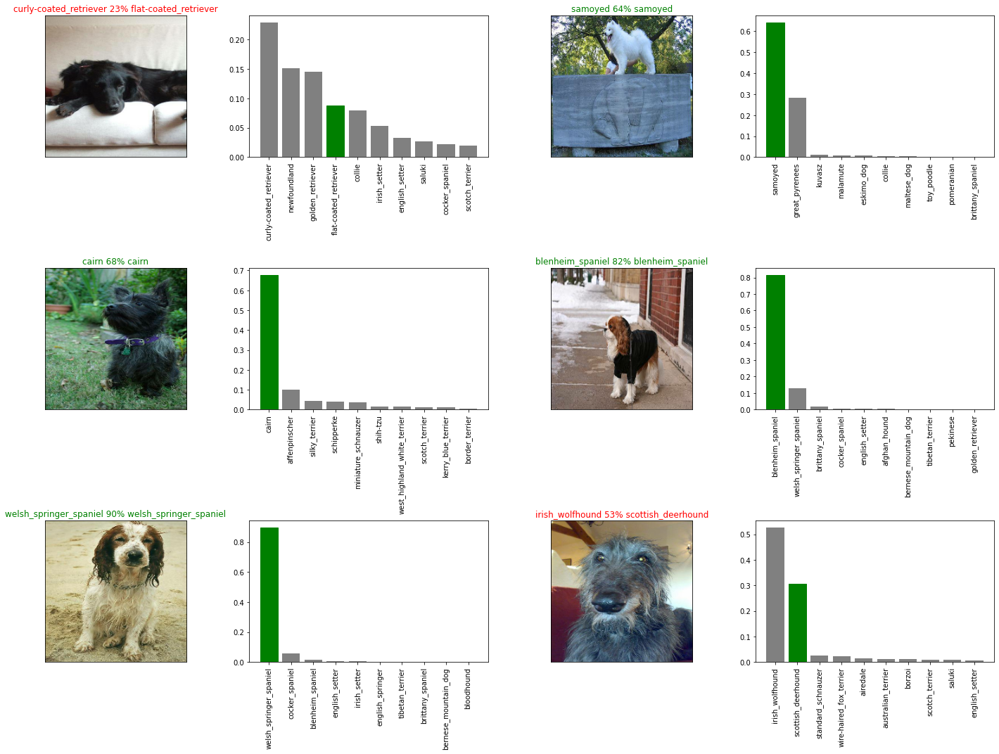

In [ ]:
# Let's checkout few predictions and their different values
i_mul = 20 #0, 10, 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_mul)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_mul)
  plt.tight_layout(h_pad = 1.0)
plt.show()  #1

# When you explain this dont write tight function, when you plot the function then write tight function

Challenge:
How would you create confusion matrix with our models predictions and true labels?

## Saving and loading the model

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5"

  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from  specified path.
  """

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  
  return model

In [ ]:
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/DogVision/models/20220313-07521647157931-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/models/20220313-07521647157931-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model('drive/MyDrive/DogVision/models/20220313-07521647157931-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20220313-07521647157931-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 183ms/step - loss: 1.2795 - accuracy: 0.6500


[1.279451847076416, 0.6499999761581421]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 171ms/step - loss: 1.2795 - accuracy: 0.6500


[1.279451847076416, 0.6499999761581421]

# Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a databtch with full dataset
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note** Running the cell below will take a little while (maybe up to 30 mins for first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 84s 232ms/step - loss: 1.3396 - accuracy: 0.6674
Epoch 2/100
320/320 [==============================] - 75s 234ms/step - loss: 0.4009 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 63s 197ms/step - loss: 0.2344 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 51s 158ms/step - loss: 0.1530 - accuracy: 0.9641
Epoch 5/100
320/320 [==============================] - 53s 165ms/step - loss: 0.1050 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 54s 169ms/step - loss: 0.0766 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 54s 170ms/step - loss: 0.0585 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 55s 172ms/step - loss: 0.0465 - accuracy: 0.9933
Epoch 9/100
320/320 [==============================] - 55s 173ms/step - loss: 0.0370 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 60s 187m

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/DogVision/models/20220313-08281647160119-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/models/20220313-08281647160119-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/DogVision/models/20220313-08281647160119-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20220313-08281647160119-full-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset

Since our model has been trained on images in the form of of Tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* convert the filenames into test data batches using `create_data_batches()` and setting the `test_data()` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/DogVision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/DogVision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/DogVision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/DogVision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/DogVision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/DogVision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/DogVision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/DogVision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/DogVision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches....


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 53s 164ms/step


In [ ]:
len(filenames)

10222

In [ ]:
# Save predictions
np.savetxt("drive/MyDrive/DogVision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/DogVision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[5.65658596e-11, 2.51160828e-11, 5.08649655e-14, ...,
        1.18021272e-12, 1.82110327e-09, 1.09104489e-10],
       [1.51608606e-06, 1.03828575e-06, 1.53234808e-07, ...,
        7.54692767e-11, 9.40443527e-08, 3.77854281e-09],
       [2.70063943e-10, 1.35166556e-06, 9.20847754e-08, ...,
        2.53703547e-06, 1.18756810e-10, 2.18537230e-10],
       ...,
       [2.35432185e-09, 3.33465755e-10, 2.51823146e-10, ...,
        7.94314961e-12, 3.38108881e-11, 2.41836218e-10],
       [1.54221372e-10, 2.25859820e-09, 2.48059906e-09, ...,
        2.22635354e-05, 2.10996145e-08, 6.72827696e-11],
       [7.44978701e-09, 3.64626385e-11, 3.24345030e-11, ...,
        1.94521829e-12, 5.39125515e-11, 2.17419640e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['000621fb3cbb32d8935728e48679680e',
 '00102ee9d8eb90812350685311fe5890',
 '0012a730dfa437f5f3613fb75efcd4ce',
 '001510bc8570bbeee98c8d80c8a95ec1',
 '001a5f3114548acdefa3d4da05474c2e',
 '00225dcd3e4d2410dd53239f95c0352f',
 '002c2a3117c2193b4d26400ce431eebd',
 '002c58d413a521ae8d1a5daeb35fc803',
 '002f80396f1e3db687c5932d7978b196',
 '0036c6bcec6031be9e62a257b1c3c442',
 '0041940322116ae58c38130f5a6f71f9',
 '0042d6bf3e5f3700865886db32689436',
 '004476c96f575879af4af471af65cae8',
 '00485d47de966a9437ad3b33ac193b6f',
 '00496f65de6cc319145ce97bd6e90360',
 '004bf14426d1a830d459a9e0c0721309',
 '004c3721eb88358f462cdcec6b2380b7',
 '00559f56aab7e0a7749220f6aed65162',
 '005b281f1a4d6f29d527c9585e9bd33c',
 '005b6c6c76fefd6b458ef6fb6e54da6e',
 '006870b49353779b25eeb91fed43c31a',
 '0068f3a21b159ece126a28580cdad7a0',
 '0069b1cc4546fc98f84f981bf9a0696a',
 '0077bc3c63486ff09d3774d956af8f76',
 '00780e5d2bf4f7e4b5f96d08ddde669a',
 '007ed71136966728f5c0936e23c8286b',
 '0081831ceb49cd64212c32b884036b82',
 

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,5.656586e-11,2.511608e-11,5.086497e-14,4.046657e-13,5.175489e-12,1.525860e-10,1.755413e-15,1.933526e-12,2.098337e-13,...,1.913138e-11,1.835901e-13,5.630753e-14,1.256459e-13,3.069698e-13,4.085700e-12,7.344396e-13,1.180213e-12,1.821103e-09,1.091045e-10
1,00102ee9d8eb90812350685311fe5890,1.516086e-06,1.038286e-06,1.532348e-07,2.141988e-09,6.339416e-06,3.187631e-08,3.595555e-06,5.295535e-07,4.665480e-08,...,3.460629e-08,3.828651e-07,1.848131e-08,5.155619e-06,4.850148e-08,6.392726e-08,1.627906e-04,7.546928e-11,9.404435e-08,3.778543e-09
2,0012a730dfa437f5f3613fb75efcd4ce,2.700639e-10,1.351666e-06,9.208478e-08,7.381142e-10,1.156815e-10,2.207738e-08,3.427922e-11,1.898100e-11,6.258492e-09,...,8.405293e-12,4.910281e-11,1.995023e-07,1.974489e-06,7.849687e-08,1.358764e-07,7.856067e-12,2.537035e-06,1.187568e-10,2.185372e-10
3,001510bc8570bbeee98c8d80c8a95ec1,4.405353e-06,5.292393e-07,1.063669e-06,1.211811e-05,4.862429e-04,5.852617e-07,9.490045e-11,1.122827e-08,1.664076e-07,...,1.264186e-06,3.139315e-10,1.158658e-06,5.871798e-09,1.094309e-07,4.757937e-10,1.219863e-13,7.770065e-02,3.723514e-11,3.006024e-06
4,001a5f3114548acdefa3d4da05474c2e,2.518566e-04,2.305587e-05,4.481282e-08,6.588918e-10,2.494636e-09,6.865973e-11,5.630632e-10,8.040306e-09,1.118946e-08,...,5.562850e-07,2.466861e-10,2.233005e-10,8.750447e-11,9.875190e-10,2.337369e-09,1.081872e-10,1.817434e-07,1.025830e-09,1.150626e-07


In [ ]:
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv", index = False)